# Intorduction to Audio
In this notebook, we will cover the basics of audio, starting with the basics of sound and how it is represented in the digital domain. We will then cover the basics of audio processing, including sampling, quantization, and encoding. Finally, we will cover the basics of audio synthesis, including additive synthesis, subtractive synthesis, and frequency modulation synthesis.

## What is Sound?
Sound is a form of energy that travels through the air as waves. These waves are created by vibrations, which are caused by the movement of objects. For example, when you speak, listen to music, play musical instrument your vocal cords vibrate, creating sound waves that travel through the air and reach your ears. These sound waves are then converted into electrical signals by the hair cells in your inner ear, which are then sent to your brain for processing. 

In this notebook we will cover how these waves are represented in the digital domain, and how they can be manipulated and synthesized using digital signal processing techniques. Lets us get statarted by how sound is represented in the digital domain. 

## How is Sound Represented in the Digital Domain?
Sound is represented in the digital domain as a sequence of numbers. These numbers are called samples, and they represent the amplitude of the sound wave at a particular point in time. For example, if we have a sound wave with a frequency of 440 Hz, we can represent it as a sequence of numbers with a sampling rate of 44100 Hz. This means that we are sampling the sound wave 44100 times per second, and each sample represents the amplitude of the sound wave at that particular point in time.

## What is Sampling? and where does 44100 Hz come from?
Sampling is the process of converting an analog signal into a digital signal. It is done by measuring the amplitude of the signal at regular intervals, called samples. The number of samples per second is called the sampling rate, and it is measured in Hertz (Hz). Sampling of audio signals is usually done at a rate of 44100 Hz, which is the standard sampling rate for audio CDs. This means that the audio signal is sampled 44100 times per second, and each sample represents the amplitude of the signal at that particular point in time. Let us have a look at the following figure to understand this better. 


In [2]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd

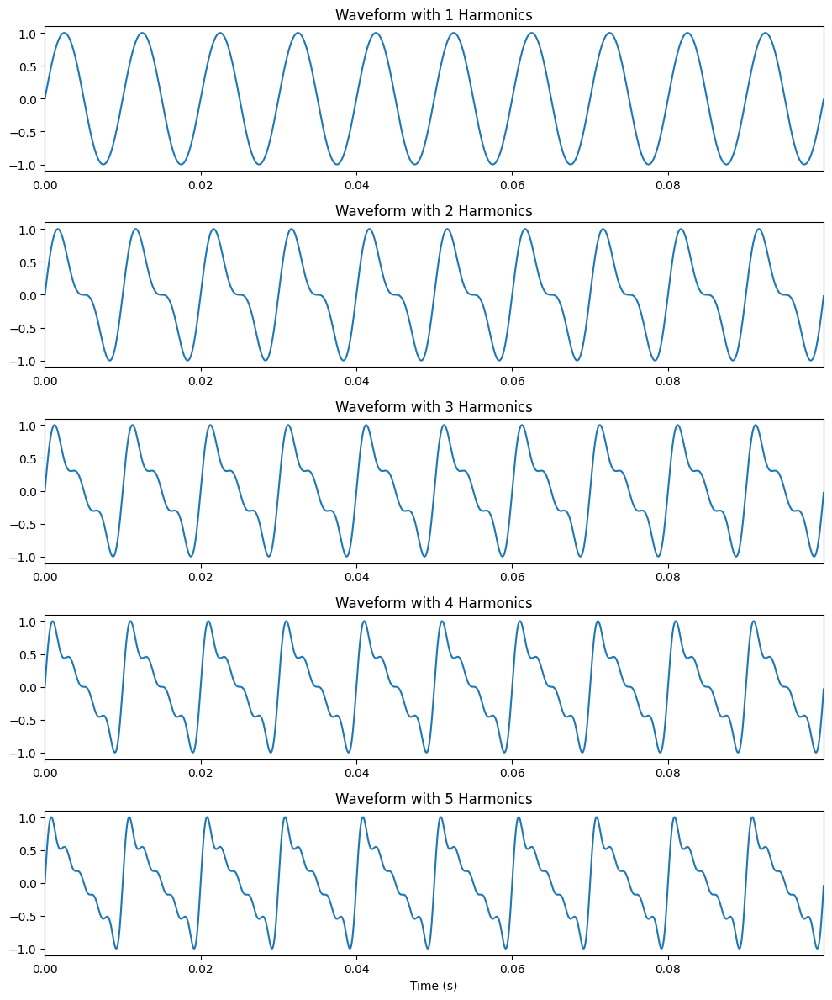

In [3]:

# Constants
SAMPLE_RATE = 44100  # samples per second, standard for audio
DURATION = 1  # duration of the waveform in seconds
FUNDAMENTAL_FREQ = 100  # fundamental frequency in Hz

# Generate time values
t = np.linspace(0, DURATION, int(SAMPLE_RATE * DURATION), endpoint=False)

def generate_waveform(harmonics_count):
    """Generate a waveform with a given number of harmonics."""
    waveform = np.zeros_like(t)
    for i in range(1, harmonics_count + 1):
        waveform += np.sin(2 * np.pi * i * FUNDAMENTAL_FREQ * t) / i  # dividing by i to reduce amplitude of higher harmonics
    
    # Normalize the waveform
    waveform = waveform / np.max(np.abs(waveform))
    return waveform

# Visualize waveforms for the first 5 harmonics
waveforms = [generate_waveform(i) for i in range(1, 6)]

fig, axs = plt.subplots(5, 1, figsize=(10, 12))

for i, waveform in enumerate(waveforms):
    axs[i].plot(t[:SAMPLE_RATE//10], waveform[:SAMPLE_RATE//10])  # plotting only the first 1/10th of a second for clarity
    axs[i].set_title(f"Waveform with {i+1} Harmonics")
    axs[i].set_xlim([0, t[SAMPLE_RATE//10 - 1]])
    axs[i].set_ylim([-1.1, 1.1])

axs[-1].set_xlabel("Time (s)")
plt.tight_layout()
plt.show()


In [5]:
audio_players = [ipd.Audio(waveform, rate=SAMPLE_RATE) for waveform in waveforms]

for i, audio_player in enumerate(audio_players):
    print(f"Waveform with {i+1} Harmonics")
    display(audio_player)

Waveform with 1 Harmonics


Waveform with 2 Harmonics


Waveform with 3 Harmonics


Waveform with 4 Harmonics


Waveform with 5 Harmonics


# Pitch, Timbre, Loudness, and Harmonics

## Pitch 
The pitch of a sound is related to the frequency of the sound wave. The higher the frequency, the higher the pitch. For example, a sound with a frequency of 440 Hz is perceived as the note A4. If you double the frequency, you get the note A5. Note A4 has a frequency of 440 Hz, while note A5 has a frequency of 880 Hz. If you listen to these two notes, you will notice that they sound similar, but not exactly the same. This is because they have different timbres.






# Harmonics
The harmonics of a sound are related to the overtones of the sound wave. For example, a sound with a fundamental frequency of 440 Hz has overtones at 880 Hz, 1320 Hz, 1760 Hz, etc. These overtones are called harmonics, and they are perceived as the pitch of the sound. Let us have a look at the following figure to understand this better.


## Timbre
The timbre of a sound is related to the shape of the sound wave. For example, a sine wave has a pure tone, while a square wave has a harsh tone. 

# Loudness 
The loudness of a sound is related to the amplitude of the sound wave. The higher the amplitude, the louder the sound. For example, a sound with an amplitude of 1 is perceived as a whisper, while a sound with an amplitude of 10 is perceived as a shout. 

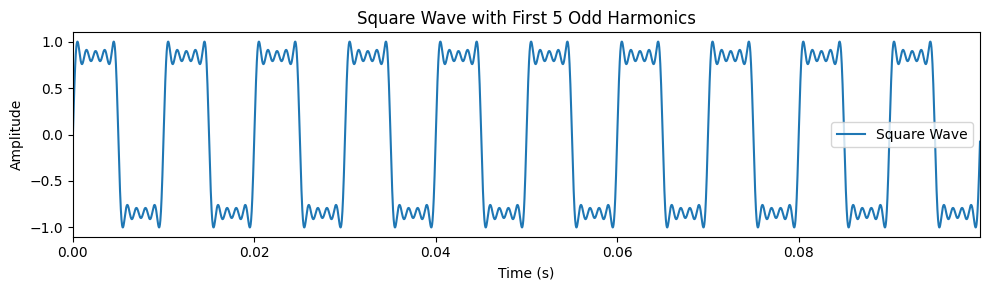

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd

# Constants
SAMPLE_RATE = 44100  # samples per second, standard for audio
DURATION = 1  # duration of the waveform in seconds
FUNDAMENTAL_FREQ = 100  # fundamental frequency in Hz

# Generate time values
t = np.linspace(0, DURATION, int(SAMPLE_RATE * DURATION), endpoint=False)

def generate_square_wave(harmonics_count):
    """Generate a square waveform using a given number of harmonics."""
    waveform = np.zeros_like(t)
    for i in range(1, harmonics_count * 2, 2):  # Only odd harmonics
        waveform += np.sin(2 * np.pi * i * FUNDAMENTAL_FREQ * t) / i
    
    # Normalize the waveform
    waveform = waveform / np.max(np.abs(waveform))
    return waveform

# Generate a square waveform using the first 5 odd harmonics
square_waveform = generate_square_wave(5)

# Plot the square waveform
plt.figure(figsize=(10, 3))
plt.plot(t[:SAMPLE_RATE//10], square_waveform[:SAMPLE_RATE//10], label="Square Wave")
plt.title("Square Wave with First 5 Odd Harmonics")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.xlim([0, t[SAMPLE_RATE//10 - 1]])
plt.ylim([-1.1, 1.1])
plt.legend()
plt.tight_layout()
plt.show()

# Return audio player for the square waveform
ipd.Audio(square_waveform, rate=SAMPLE_RATE)


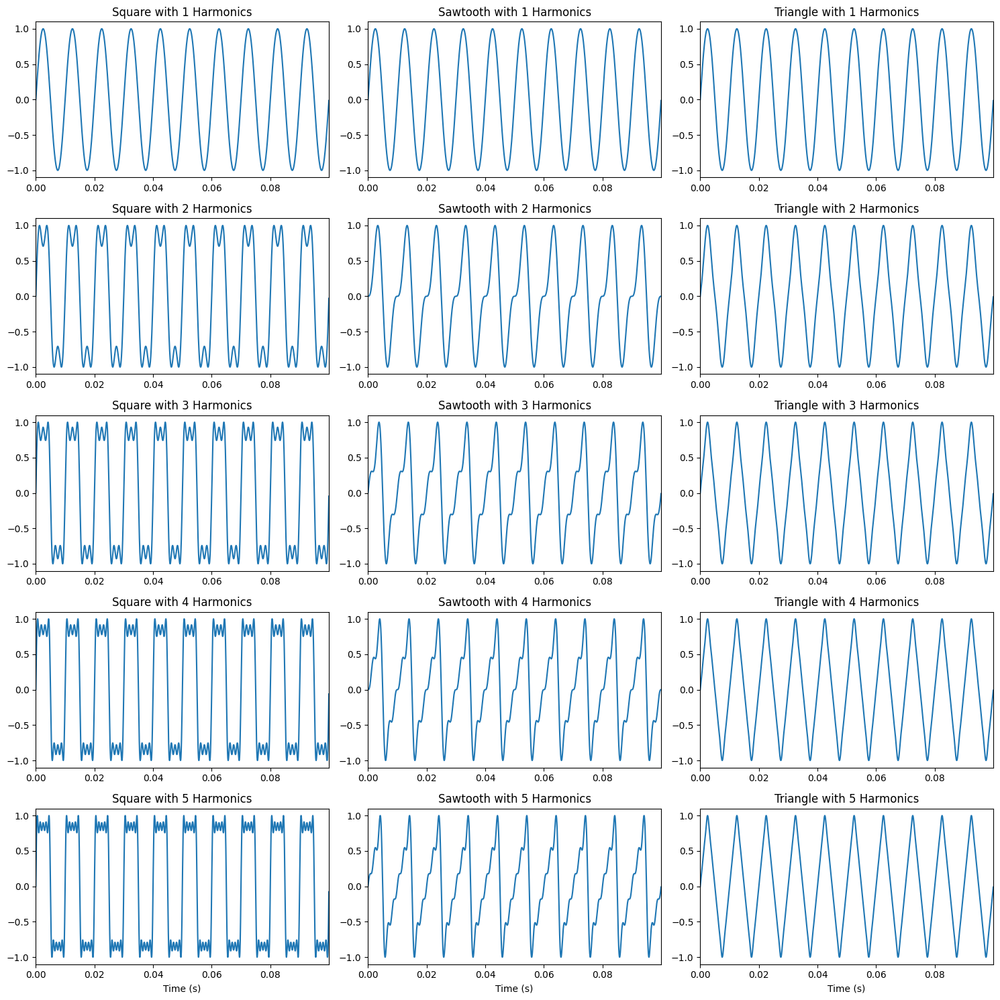

In [11]:
def generate_square_wave(harmonics_count):
    """Generate a square waveform using a given number of harmonics."""
    waveform = np.zeros_like(t)
    for i in range(1, harmonics_count * 2 + 1, 2):  # Only odd harmonics
        waveform += np.sin(2 * np.pi * i * FUNDAMENTAL_FREQ * t) / i
    return waveform / np.max(np.abs(waveform))

def generate_sawtooth_wave(harmonics_count):
    """Generate a sawtooth waveform using a given number of harmonics."""
    waveform = np.zeros_like(t)
    for i in range(1, harmonics_count + 1):
        waveform += (-1)**(i+1) * np.sin(2 * np.pi * i * FUNDAMENTAL_FREQ * t) / i
    return waveform / np.max(np.abs(waveform))

def generate_triangle_wave(harmonics_count):
    """Generate a triangle waveform using a given number of harmonics."""
    waveform = np.zeros_like(t)
    for i in range(1, harmonics_count * 2 + 1, 2):  # Only odd harmonics
        waveform += (-1)**((i-1)//2) * np.sin(2 * np.pi * i * FUNDAMENTAL_FREQ * t) / i**2
    return waveform / np.max(np.abs(waveform))

# Generate waveforms with increasing harmonics for each type
waveform_types = ["Square", "Sawtooth", "Triangle"]
waveform_generators = [generate_square_wave, generate_sawtooth_wave, generate_triangle_wave]
waveforms_collection = {}

for name, generator in zip(waveform_types, waveform_generators):
    waveforms_collection[name] = [generator(i) for i in range(1, 6)]

# Plot the generated waveforms
fig, axs = plt.subplots(5, 3, figsize=(15, 15))

for row, harmonic_count in enumerate(range(1, 6)):
    for col, waveform_type in enumerate(waveform_types):
        waveform = waveforms_collection[waveform_type][row]
        axs[row, col].plot(t[:SAMPLE_RATE//10], waveform[:SAMPLE_RATE//10])
        axs[row, col].set_title(f"{waveform_type} with {harmonic_count} Harmonics")
        axs[row, col].set_xlim([0, t[SAMPLE_RATE//10 - 1]])
        axs[row, col].set_ylim([-1.1, 1.1])
        
for ax in axs[-1]:
    ax.set_xlabel("Time (s)")

plt.tight_layout()
plt.show()


In [12]:
# Create audio players for each waveform in the collection
audio_players_collection = {}
for waveform_type, waveforms in waveforms_collection.items():
    audio_players_collection[waveform_type] = [ipd.Audio(waveform, rate=SAMPLE_RATE) for waveform in waveforms]

# Display audio players for each waveform in the collection
for waveform_type, audio_players in audio_players_collection.items():
    print(f"{waveform_type} Waveforms")
    for i, audio_player in enumerate(audio_players):
        print(f"{i+1} Harmonics")
        display(audio_player)

Square Waveforms
1 Harmonics


2 Harmonics


3 Harmonics


4 Harmonics


5 Harmonics


Sawtooth Waveforms
1 Harmonics


2 Harmonics


3 Harmonics


4 Harmonics


5 Harmonics


Triangle Waveforms
1 Harmonics


2 Harmonics


3 Harmonics


4 Harmonics


5 Harmonics


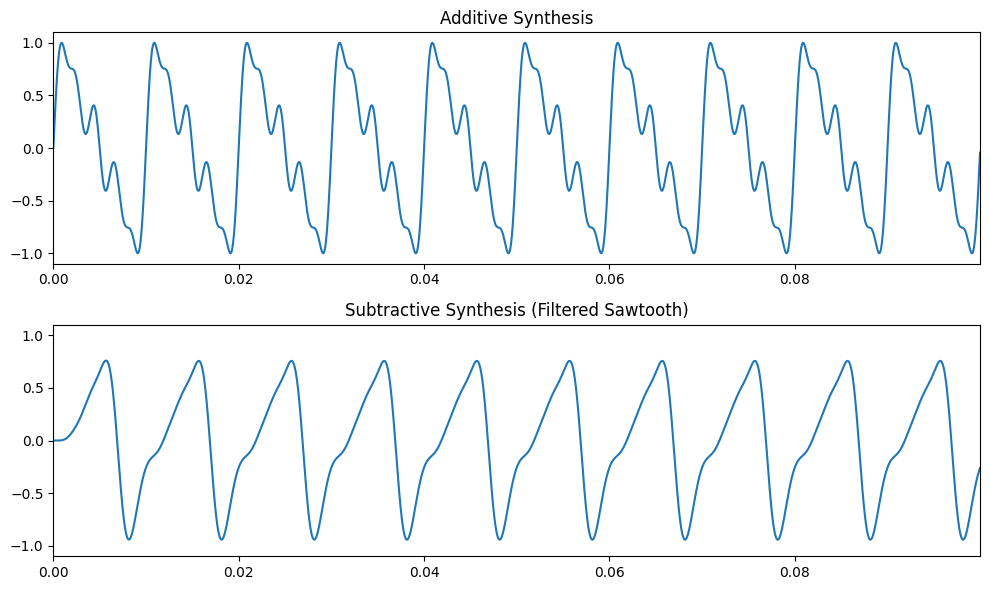

(<IPython.lib.display.Audio object>, <IPython.lib.display.Audio object>)

In [14]:

from scipy.signal import butter, lfilter

# Constants


# Definitions for additive and subtractive synthesis

def generate_sine_wave(frequency, amplitude=1):
    """Generate a sine waveform for a given frequency and amplitude."""
    return amplitude * np.sin(2 * np.pi * frequency * t)

def additive_synthesis(frequencies, amplitudes):
    """Generate a waveform by adding together sine waves with given frequencies and amplitudes."""
    waveform = np.zeros_like(t)
    for freq, amp in zip(frequencies, amplitudes):
        waveform += generate_sine_wave(freq, amp)
    return waveform / np.max(np.abs(waveform))

def butter_lowpass(cutoff, fs, order=5):
    """Design a lowpass Butterworth filter."""
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def apply_lowpass_filter(data, cutoff, fs, order=5):
    """Apply a lowpass Butterworth filter to the data."""
    b, a = butter_lowpass(cutoff, fs, order=order)
    return lfilter(b, a, data)

def generate_sawtooth_wave(harmonics_count):
    """Generate a sawtooth waveform using a given number of harmonics."""
    waveform = np.zeros_like(t)
    for i in range(1, harmonics_count + 1):
        waveform += (-1)**(i+1) * np.sin(2 * np.pi * i * FUNDAMENTAL_FREQ * t) / i
    return waveform / np.max(np.abs(waveform))

# Frequencies and amplitudes for additive synthesis
frequencies = [FUNDAMENTAL_FREQ, 2 * FUNDAMENTAL_FREQ, 3 * FUNDAMENTAL_FREQ, 5 * FUNDAMENTAL_FREQ]
amplitudes = [1, 0.5, 0.33, 0.25]

# Generate, plot, and play the waveforms for additive and subtractive synthesis
additive_waveform = additive_synthesis(frequencies, amplitudes)
sawtooth_waveform = generate_sawtooth_wave(5)
filtered_waveform = apply_lowpass_filter(sawtooth_waveform, 300, SAMPLE_RATE)

# Plot waveforms
fig, axs = plt.subplots(2, 1, figsize=(10, 6))
axs[0].plot(t[:SAMPLE_RATE//10], additive_waveform[:SAMPLE_RATE//10], label="Additive Synthesis")
axs[0].set_title("Additive Synthesis")
axs[1].plot(t[:SAMPLE_RATE//10], filtered_waveform[:SAMPLE_RATE//10], label="Subtractive Synthesis")
axs[1].set_title("Subtractive Synthesis (Filtered Sawtooth)")
for ax in axs:
    ax.set_xlim([0, t[SAMPLE_RATE//10 - 1]])
    ax.set_ylim([-1.1, 1.1])
plt.tight_layout()
plt.show()


In [15]:

# Audio players for the waveforms
additive_audio = ipd.Audio(additive_waveform, rate=SAMPLE_RATE)
subtractive_audio = ipd.Audio(filtered_waveform, rate=SAMPLE_RATE)

# Display audio players
print("Additive Synthesis")
display(additive_audio)
print("Subtractive Synthesis")
display(subtractive_audio)


Additive Synthesis


Subtractive Synthesis


In the context of music, harmonics are frequencies that fit together or are in agreement with the fundamental frequency

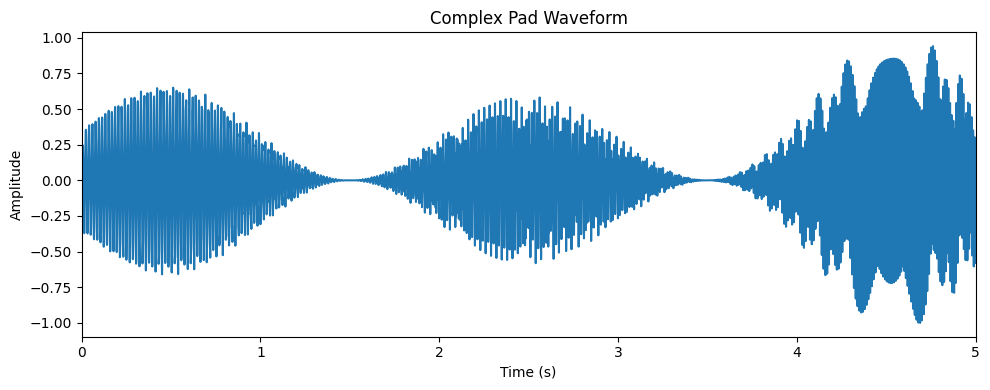

In [17]:
# Definitions for filtering functions

import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd
from scipy.signal import butter, lfilter, chirp

# Constants and time values setup
SAMPLE_RATE = 44100  # samples per second, standard for audio
DURATION = 5  # duration of the waveform in seconds
FUNDAMENTAL_FREQ = 100  # fundamental frequency in Hz
t = np.linspace(0, DURATION, int(SAMPLE_RATE * DURATION), endpoint=False)

# Definitions for the complex pad sound generation
def generate_complex_pad(duration, sample_rate):
    """Generate a pad-like sound using synthesis techniques."""
    t = np.linspace(0, duration, int(sample_rate * duration), endpoint=False)
    
    # Base waveform: Rich in harmonics (sawtooth-like but with some modulation to make it interesting)
    waveform = chirp(t, f0=55, f1=110, t1=duration, method='quadratic')
    
    # Additive synthesis: Add some harmonics
    waveform += 0.5 * np.sin(2 * np.pi * 2 * FUNDAMENTAL_FREQ * t)
    waveform += 0.3 * np.sin(2 * np.pi * 3 * FUNDAMENTAL_FREQ * t)
    
    # Filtering: Apply a lowpass filter that evolves over time (simulate opening of a filter cutoff)
    b, a = butter_lowpass(100, sample_rate)
    waveform_low = lfilter(b, a, waveform)
    b, a = butter_lowpass(800, sample_rate)
    waveform_high = lfilter(b, a, waveform)
    
    # Mix the filtered waveforms over time to simulate a changing filter cutoff
    mix_factor = np.linspace(0, 1, int(sample_rate * duration))
    waveform = waveform_low * (1 - mix_factor) + waveform_high * mix_factor
    
    # Modulation: Apply amplitude modulation to make the sound evolve
    lfo = 0.5 * np.sin(2 * np.pi * 0.5 * t) + 0.5  # Low Frequency Oscillator for amplitude modulation
    waveform *= lfo
    
    # Normalize
    waveform = waveform / np.max(np.abs(waveform))
    
    return waveform

    
def butter_lowpass(cutoff, fs, order=5):
    """Design a lowpass Butterworth filter."""
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def apply_lowpass_filter(data, cutoff, fs, order=5):
    """Apply a lowpass Butterworth filter to the data."""
    b, a = butter_lowpass(cutoff, fs, order=order)
    return lfilter(b, a, data)

# Now generate the pad sound
complex_pad_waveform = generate_complex_pad(DURATION, SAMPLE_RATE)

# Plot and play the waveform
plt.figure(figsize=(10, 4))
plt.plot(t, complex_pad_waveform)
plt.title("Complex Pad Waveform")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.xlim([0, DURATION])
plt.tight_layout()
plt.show()

complex_pad_audio = ipd.Audio(complex_pad_waveform, rate=SAMPLE_RATE)
complex_pad_audio


In [18]:
def synthesize_piano_note(frequency, duration, sample_rate):
    """Synthesize a simple piano-like note using additive synthesis."""
    t = np.linspace(0, duration, int(sample_rate * duration), endpoint=False)
    waveform = np.zeros_like(t)
    
    # Approximate the harmonics of a piano note using additive synthesis
    harmonics_freqs = [frequency, 2 * frequency, 3 * frequency, 4 * frequency, 5 * frequency]
    harmonics_amps = [1.0, 0.5, 0.25, 0.125, 0.075]
    
    for freq, amp in zip(harmonics_freqs, harmonics_amps):
        waveform += amp * np.sin(2 * np.pi * freq * t)
    
    # Apply a simple envelope to simulate the attack and decay of a piano note
    attack_time = 0.1  # seconds
    decay_time = 0.5  # seconds
    sustain_level = 0.7
    release_time = 0.4  # seconds
    
    attack_samples = int(attack_time * sample_rate)
    decay_samples = int(decay_time * sample_rate)
    sustain_samples = len(t) - attack_samples - decay_samples
    release_samples = int(release_time * sample_rate)
    
    envelope = np.concatenate([
        np.linspace(0, 1, attack_samples),
        np.linspace(1, sustain_level, decay_samples),
        sustain_level * np.ones(sustain_samples),
        np.linspace(sustain_level, 0, release_samples)
    ])
    
    waveform *= envelope[:len(t)]
    
    # Normalize
    waveform = waveform / np.max(np.abs(waveform))
    
    return waveform

# Synthesize a piano-like note
piano_note_waveform = synthesize_piano_note(261.63, DURATION, SAMPLE_RATE)  # Middle C (C4) frequency

# Play the synthesized piano note
ipd.Audio(piano_note_waveform, rate=SAMPLE_RATE)


In [21]:
def apply_highpass_filter(data, cutoff, fs, order=5):
    """Apply a highpass Butterworth filter to the data."""
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    return lfilter(b, a, data)


# Apply the filters to the synthesized piano note
lowpass_filtered_waveform = apply_lowpass_filter(piano_note_waveform, 800, SAMPLE_RATE)
highpass_filtered_waveform = apply_highpass_filter(piano_note_waveform, 800, SAMPLE_RATE)

# Audio players for the filtered waveforms
lowpass_audio = ipd.Audio(lowpass_filtered_waveform, rate=SAMPLE_RATE)
highpass_audio = ipd.Audio(highpass_filtered_waveform, rate=SAMPLE_RATE)

# Display audio players
print("Lowpass Filtered Piano Note")
display(lowpass_audio)
print("Highpass Filtered Piano Note")
display(highpass_audio)


Lowpass Filtered Piano Note


Highpass Filtered Piano Note


In [23]:
def synthesize_sound(frequency, duration, sample_rate, harmonics_factor, envelope_factors):
    """Synthesize a sound by manipulating its pitch, harmonics, and timbre."""
    t = np.linspace(0, duration, int(sample_rate * duration), endpoint=False)
    waveform = np.zeros_like(t)
    
    # Fundamental frequency determines the pitch
    waveform += np.sin(2 * np.pi * frequency * t)
    
    # Add harmonics based on the harmonics_factor (for timbral variation)
    for i in range(2, 6):  # adding the next 4 harmonics
        waveform += harmonics_factor[i-2] * np.sin(2 * np.pi * i * frequency * t)
    
    # Apply an ADSR envelope to shape the timbre further
    attack_time, decay_time, sustain_level, release_time = envelope_factors
    attack_samples = int(attack_time * sample_rate)
    decay_samples = int(decay_time * sample_rate)
    sustain_samples = len(t) - attack_samples - decay_samples
    release_samples = int(release_time * sample_rate)
    
    envelope = np.concatenate([
        np.linspace(0, 1, attack_samples),
        np.linspace(1, sustain_level, decay_samples),
        sustain_level * np.ones(sustain_samples),
        np.linspace(sustain_level, 0, release_samples)
    ])
    
    waveform *= envelope[:len(t)]
    
    # Normalize
    waveform = waveform / np.max(np.abs(waveform))
    
    return waveform

# Synthesize three variations of a sound by manipulating its pitch, harmonics, and timbre
sound1 = synthesize_sound(261.63, DURATION, SAMPLE_RATE, [0.5, 0.33, 0.25, 0.2], [0.1, 0.2, 0.6, 0.2])  # Middle C
sound2 = synthesize_sound(329.63, DURATION, SAMPLE_RATE, [0.4, 0.3, 0.15, 0.1], [0.1, 0.3, 0.5, 0.3])  # E
sound3 = synthesize_sound(392.00, DURATION, SAMPLE_RATE, [0.6, 0.4, 0.3, 0.25], [0.1, 0.4, 0.4, 0.2])  # G

# Audio players for the synthesized sounds
sound1_audio = ipd.Audio(sound1, rate=SAMPLE_RATE)
sound2_audio = ipd.Audio(sound2, rate=SAMPLE_RATE)
sound3_audio = ipd.Audio(sound3, rate=SAMPLE_RATE)

# Display audio players
print("Sound 1")
display(sound1_audio)
print("Sound 2")
display(sound2_audio)
print("Sound 3")
display(sound3_audio)

Sound 1


Sound 2


Sound 3
